## Librerias

In [44]:
import numpy as np

In [45]:
import pandas as pd

In [46]:
import os

In [47]:
import cv2

In [48]:
from keras.utils import to_categorical

In [49]:
from keras.models import Model

In [50]:
from keras.layers import Conv2D, Activation, BatchNormalization, Add, Input, Dropout, GlobalAveragePooling2D, Dense

In [51]:
from keras.regularizers import *

In [52]:
from keras.optimizers import RMSprop, Adam

In [53]:
from matplotlib import pyplot as plt

In [54]:
from PIL import Image

In [55]:
import shutil

In [56]:
from skimage.filters.rank import equalize

In [57]:
from skimage.morphology import disk, ball

In [58]:
from mtcnn import MTCNN

In [59]:
from sklearn.model_selection import train_test_split

In [60]:
from tensorflow.keras.models import load_model

In [61]:
import random

In [62]:
from keras.callbacks import ModelCheckpoint

## Face detector

In [16]:
# we create an instance
detector = MTCNN()

## Crop Faces

In [17]:
def cropFaces(img):
    #dectect faces in the image
    faces = detector.detect_faces(img)
    if len(faces) == 0:
        return faces
    x, y, width, height = faces[0]['box']
    return img[y:y+height+1, x:x+width+1, :]

## Procesamiento de imagenes

### Redimenzionar imagenes

### Convertir imagenes a RGB

In [18]:
def convertir_a_rgb_en_subcarpetas(directorio_base):
    subcarpetas = [subcarpeta for subcarpeta in os.listdir(directorio_base) if os.path.isdir(os.path.join(directorio_base, subcarpeta))]

    
    for subcarpeta in subcarpetas:
        subdirectorio = os.path.join(directorio_base, subcarpeta)
        archivos = os.listdir(subdirectorio)

        # Convertir a RGB cada imagen en la subcarpeta
        for archivo in archivos:
            ruta_imagen = os.path.join(subdirectorio, archivo)
            try:
                img = Image.open(ruta_imagen)
                
                
                if img.mode != 'RGB':
                    img_rgb = img.convert('RGB')
                    img_rgb.save(ruta_imagen)
                    print(f"Imagen convertida a RGB: {ruta_imagen}")
                else:
                    print(f"La imagen ya está en formato RGB: {ruta_imagen}")
                    
            except Exception as e:
                print(f"Error al procesar la imagen: {ruta_imagen}. {str(e)}")

In [ ]:
convertir_a_rgb_en_subcarpetas('./face/')

La imagen ya está en formato RGB: ./face/aldahir\0.jpg
La imagen ya está en formato RGB: ./face/aldahir\1.jpg
La imagen ya está en formato RGB: ./face/aldahir\10.jpg
La imagen ya está en formato RGB: ./face/aldahir\11.jpg
La imagen ya está en formato RGB: ./face/aldahir\2.jpg
La imagen ya está en formato RGB: ./face/aldahir\3.jpg
La imagen ya está en formato RGB: ./face/aldahir\4.jpg
La imagen ya está en formato RGB: ./face/aldahir\5.jpg
La imagen ya está en formato RGB: ./face/aldahir\6.jpg
La imagen ya está en formato RGB: ./face/aldahir\7.jpg
La imagen ya está en formato RGB: ./face/aldahir\8.jpg
La imagen ya está en formato RGB: ./face/aldahir\9.jpg
La imagen ya está en formato RGB: ./face/alvaro\0.jpg
La imagen ya está en formato RGB: ./face/alvaro\1.jpg
La imagen ya está en formato RGB: ./face/alvaro\10.jpg
La imagen ya está en formato RGB: ./face/alvaro\11.jpg
La imagen ya está en formato RGB: ./face/alvaro\2.jpg
La imagen ya está en formato RGB: ./face/alvaro\3.jpg
La imagen ya

### Leer Imagenes

In [19]:
def read_this(image_file, gray_scale=False):
    image_src = cv2.imread(image_file)
    if gray_scale:
        image_src = cv2.cvtColor(image_src, cv2.COLOR_BGR2GRAY)
    else:
        image_src = cv2.cvtColor(image_src, cv2.COLOR_BGR2RGB)
    return image_src

### Remover ruido

In [20]:
def remove_noise(image_file,name='new',i=0):  
    image = image_src = read_this(image_file=image_file, gray_scale=False)

    plt.figure(figsize=(10, 20))
    plt.subplot(1, 2, 1)
    plt.title("Original")
    plt.imshow(image)
    plt.axis('off')
    # Remover ruido utilizando filtro mediana
    filtered_image = cv2.medianBlur(image, 3) #you would use 11 but in image short is not good

    plt.subplot(1, 2, 2)
    plt.title("Median Blur")
    plt.imshow(filtered_image)
    plt.axis('off')
    plt.show()
    print(filtered_image.shape)
    # Guardar la imagen en formato RGB en la carpeta ./new/faces/
    output_folder = f'./face/{name}/'
    output_filename = output_folder + f'{i}.jpg'
    image_eq_rgb = cv2.cvtColor(filtered_image, cv2.COLOR_BGR2RGB)
    cv2.imwrite(output_filename, image_eq_rgb)


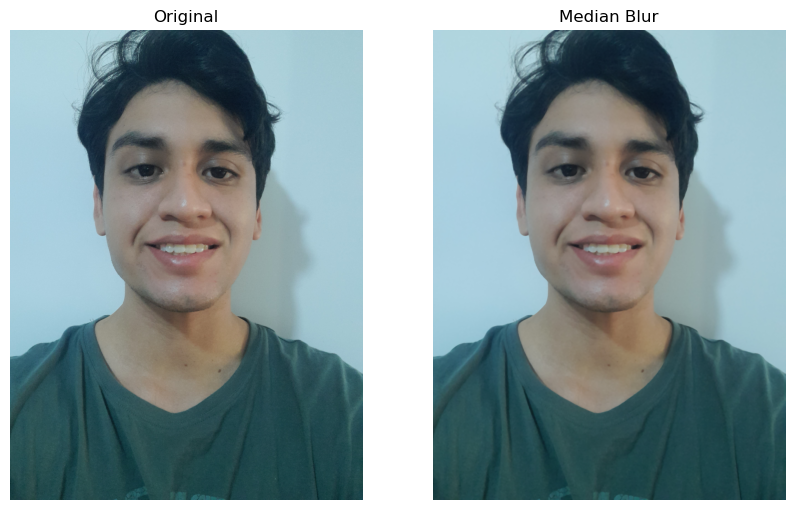

(3408, 2556, 3)


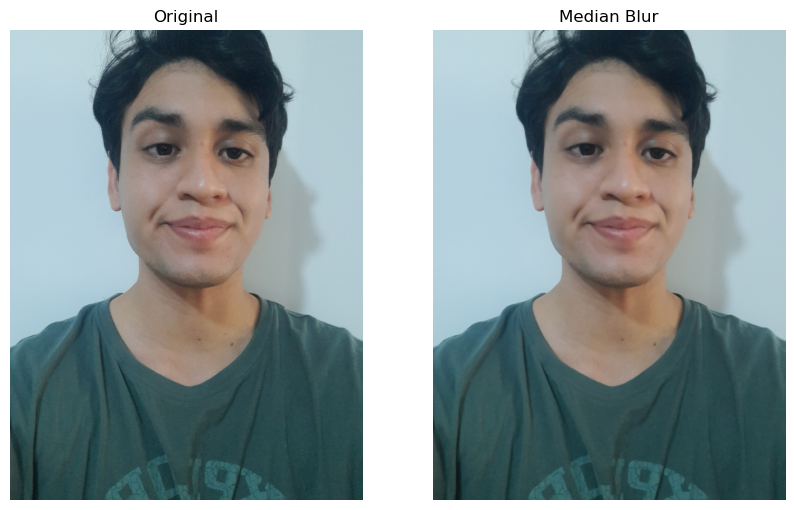

(3408, 2556, 3)


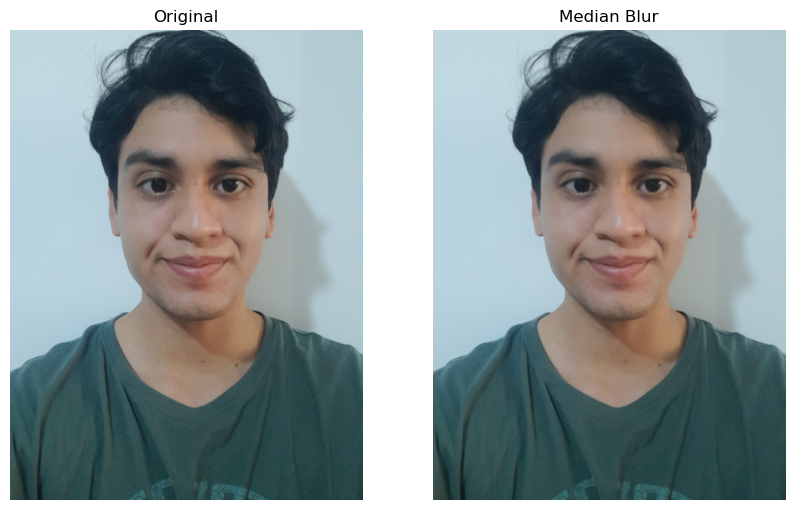

(3408, 2556, 3)


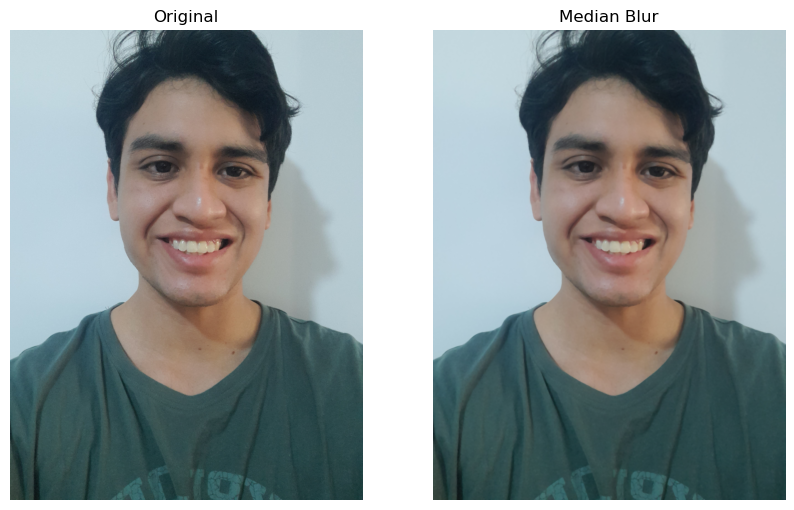

(3408, 2556, 3)


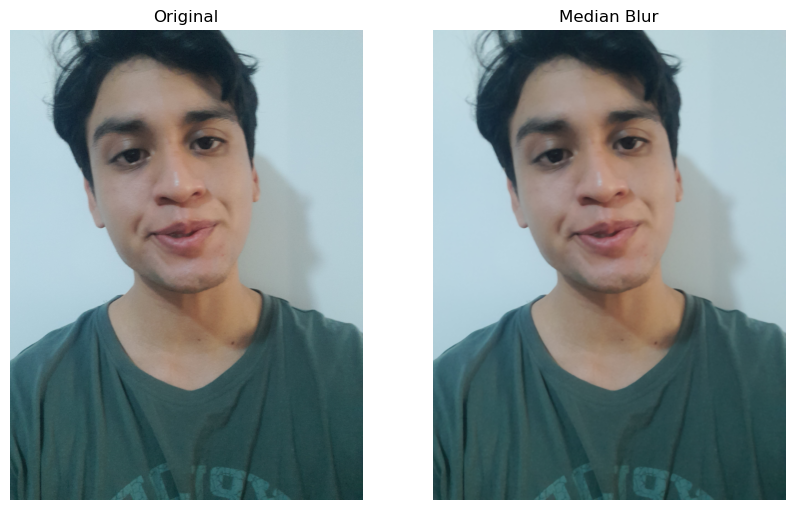

(3408, 2556, 3)


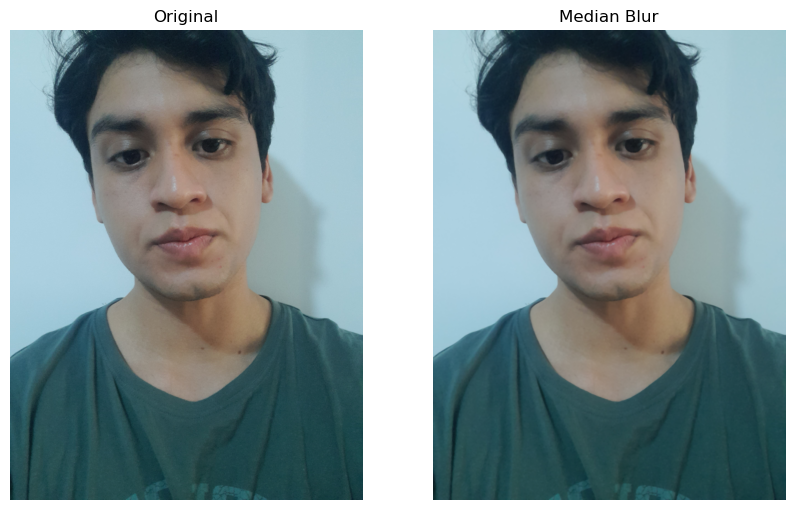

(3408, 2556, 3)


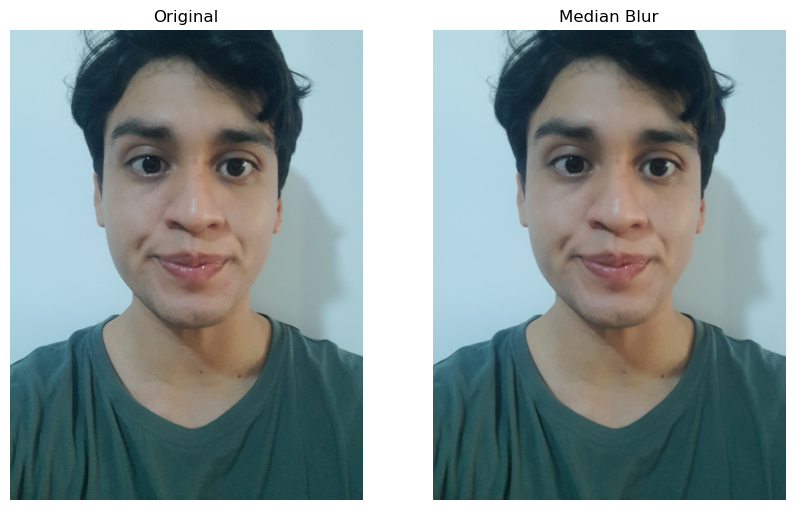

(3408, 2556, 3)


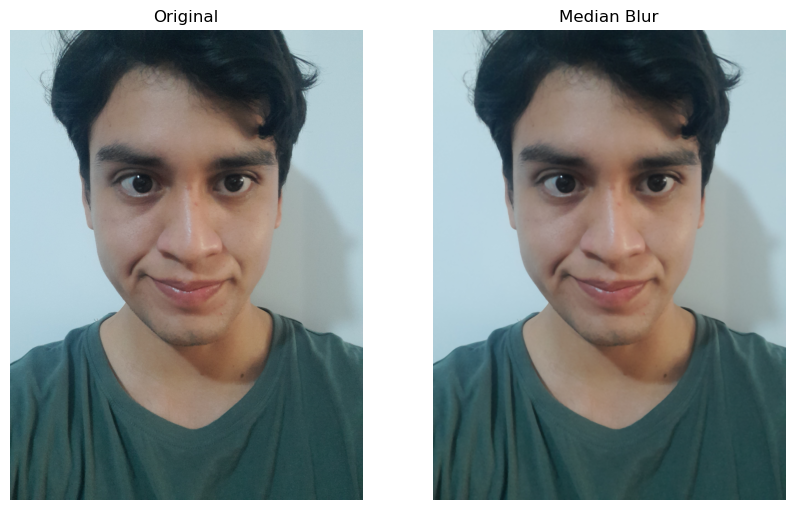

(3408, 2556, 3)


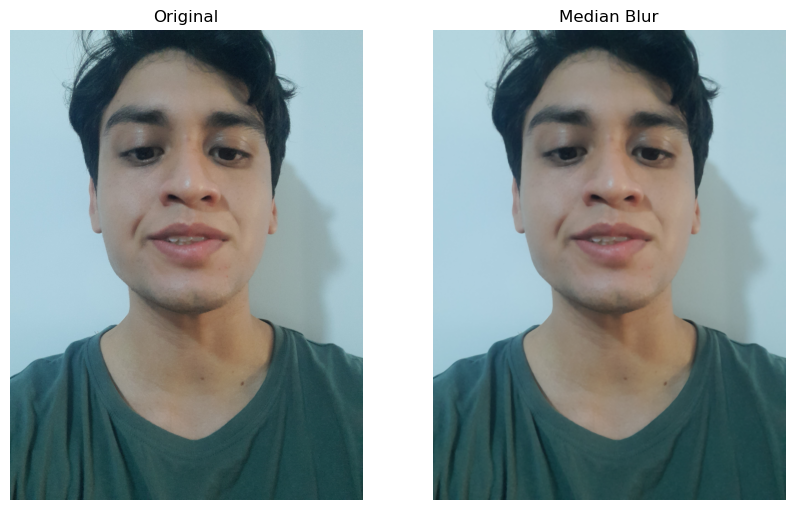

(3408, 2556, 3)


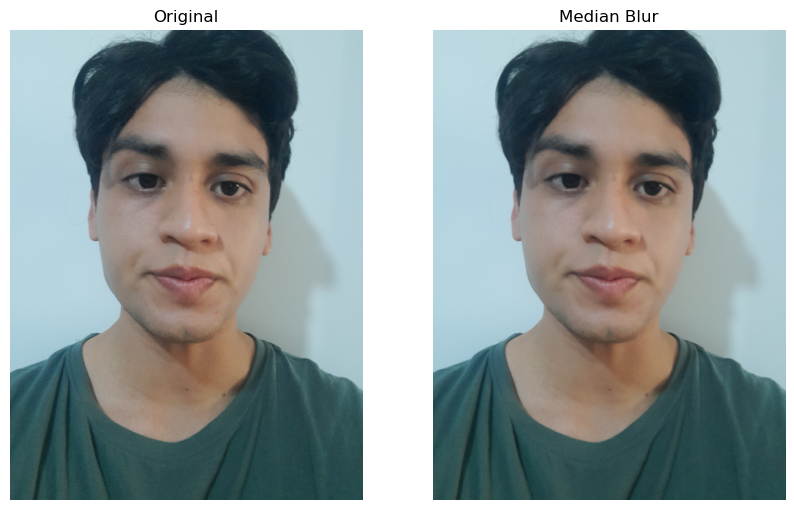

(3408, 2556, 3)


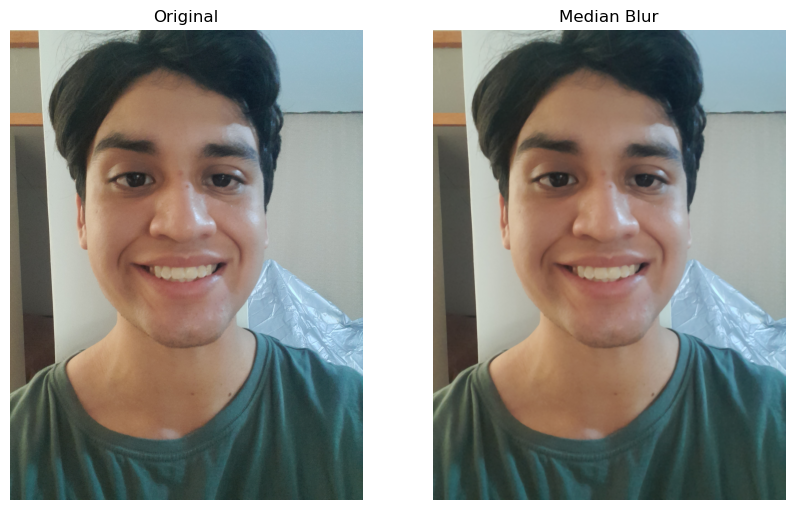

(3408, 2556, 3)


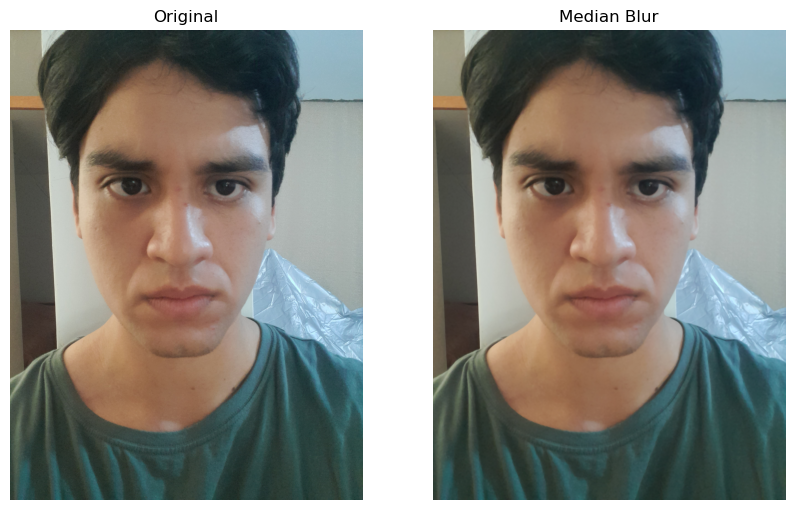

(3408, 2556, 3)


In [194]:
for i in range(0,12):
    remove_noise(image_file=f'./face/jose_luis/{i}.jpg',name='jose_luis',i=i)

In [21]:
def sha_lig_correction(
        img,
        shadow_amount_percent, shadow_tone_percent, shadow_radius,
        highlight_amount_percent, highlight_tone_percent, highlight_radius,
        color_percent
):
    """
    Image Shadow / Highlight Correction. The same function as it in Photoshop / GIMP
    :param img: input RGB image numpy array of shape (height, width, 3)
    :param shadow_amount_percent [0.0 ~ 1.0]: Controls (separately for the highlight and shadow values in the image) how much of a correction to make.
    :param shadow_tone_percent [0.0 ~ 1.0]: Controls the range of tones in the shadows or highlights that are modified.
    :param shadow_radius [>0]: Controls the size of the local neighborhood around each pixel
    :param highlight_amount_percent [0.0 ~ 1.0]: Controls (separately for the highlight and shadow values in the image) how much of a correction to make.
    :param highlight_tone_percent [0.0 ~ 1.0]: Controls the range of tones in the shadows or highlights that are modified.
    :param highlight_radius [>0]: Controls the size of the local neighborhood around each pixel
    :param color_percent [-1.0 ~ 1.0]:
    :return:
    """
    shadow_tone = shadow_tone_percent * 255
    highlight_tone = 255 - highlight_tone_percent * 255

    shadow_gain = 1 + shadow_amount_percent * 6
    highlight_gain = 1 + highlight_amount_percent * 6

    # extract RGB channel
    height, width = img.shape[:2]
    img = img.astype(np.float)
    img_R, img_G, img_B = img[..., 2].reshape(-1), img[..., 1].reshape(-1), img[..., 0].reshape(-1)

    # The entire correction process is carried out in YUV space,
    # adjust highlights/shadows in Y space, and adjust colors in UV space
    # convert to Y channel (grey intensity) and UV channel (color)
    img_Y = .3 * img_R + .59 * img_G + .11 * img_B
    img_U = -img_R * .168736 - img_G * .331264 + img_B * .5
    img_V = img_R * .5 - img_G * .418688 - img_B * .081312

    # extract shadow / highlight
    shadow_map = 255 - img_Y * 255 / shadow_tone
    shadow_map[np.where(img_Y >= shadow_tone)] = 0
    highlight_map = 255 - (255 - img_Y) * 255 / (255 - highlight_tone)
    highlight_map[np.where(img_Y <= highlight_tone)] = 0

    # // Gaussian blur on tone map, for smoother transition
    if shadow_amount_percent * shadow_radius > 0:
        # shadow_map = cv2.GaussianBlur(shadow_map.reshape(height, width), ksize=(shadow_radius, shadow_radius), sigmaX=0).reshape(-1)
        shadow_map = cv2.blur(shadow_map.reshape(height, width), ksize=(shadow_radius, shadow_radius)).reshape(-1)

    if highlight_amount_percent * highlight_radius > 0:
        # highlight_map = cv2.GaussianBlur(highlight_map.reshape(height, width), ksize=(highlight_radius, highlight_radius), sigmaX=0).reshape(-1)
        highlight_map = cv2.blur(highlight_map.reshape(height, width), ksize=(highlight_radius, highlight_radius)).reshape(-1)

    # Tone LUT
    t = np.arange(256)
    LUT_shadow = (1 - np.power(1 - t * (1 / 255), shadow_gain)) * 255
    LUT_shadow = np.maximum(0, np.minimum(255, np.int_(LUT_shadow + .5)))
    LUT_highlight = np.power(t * (1 / 255), highlight_gain) * 255
    LUT_highlight = np.maximum(0, np.minimum(255, np.int_(LUT_highlight + .5)))

    # adjust tone
    shadow_map = shadow_map * (1 / 255)
    highlight_map = highlight_map * (1 / 255)

    iH = (1 - shadow_map) * img_Y + shadow_map * LUT_shadow[np.int_(img_Y)]
    iH = (1 - highlight_map) * iH + highlight_map * LUT_highlight[np.int_(iH)]
    img_Y = iH

    # adjust color
    if color_percent != 0:
        # color LUT
        if color_percent > 0:
            LUT = (1 - np.sqrt(np.arange(32768)) * (1 / 128)) * color_percent + 1
        else:
            LUT = np.sqrt(np.arange(32768)) * (1 / 128) * color_percent + 1

        # adjust color saturation adaptively according to highlights/shadows
        color_gain = LUT[np.int_(img_U ** 2 + img_V ** 2 + .5)]
        w = 1 - np.minimum(2 - (shadow_map + highlight_map), 1)
        img_U = w * img_U + (1 - w) * img_U * color_gain
        img_V = w * img_V + (1 - w) * img_V * color_gain

    # re convert to RGB channel
    output_R = np.int_(img_Y + 1.402 * img_V + .5)
    output_G = np.int_(img_Y - .34414 * img_U - .71414 * img_V + .5)
    output_B = np.int_(img_Y + 1.772 * img_U + .5)

    output = np.row_stack([output_B, output_G, output_R]).T.reshape(height, width, 3)
    output = output = np.minimum(np.maximum(output, 0), 255).astype(np.uint8)
    return output

In [22]:
def remove_sha_lig(image_file,name='new',i=0):  
    image = image_src = read_this(image_file=image_file, gray_scale=False)

    plt.figure(figsize=(10, 20))
    plt.subplot(1, 2, 1)
    plt.title("Original")
    plt.imshow(image)
    plt.axis('off')
    # Remover sha-lig
    filtered_image = sha_lig_correction(
        image,
        shadow_amount_percent=0.01, shadow_tone_percent=1, shadow_radius=1,
        highlight_amount_percent=0.01, highlight_tone_percent=0.01, highlight_radius=1,
        color_percent=0.3
    )

    plt.subplot(1, 2, 2)
    plt.title("Remove light and shadows")
    plt.imshow(filtered_image)
    plt.axis('off')
    plt.show()
    print(filtered_image.shape)
    # Guardar la imagen en formato RGB en la carpeta ./new/faces/
    output_folder = f'./face_sha_lig/{name}/'
    output_filename = output_folder + f'{i}.jpg'
    image_eq_rgb = cv2.cvtColor(filtered_image, cv2.COLOR_BGR2RGB)
    cv2.imwrite(output_filename, image_eq_rgb)

C:\Users\Admin\AppData\Local\Temp\ipykernel_16728\1136154732.py:27: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  img = img.astype(np.float)


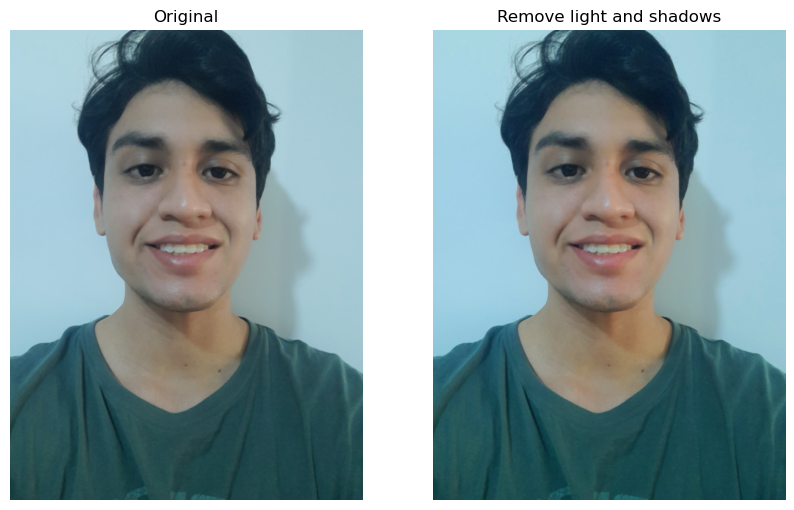

(3408, 2556, 3)


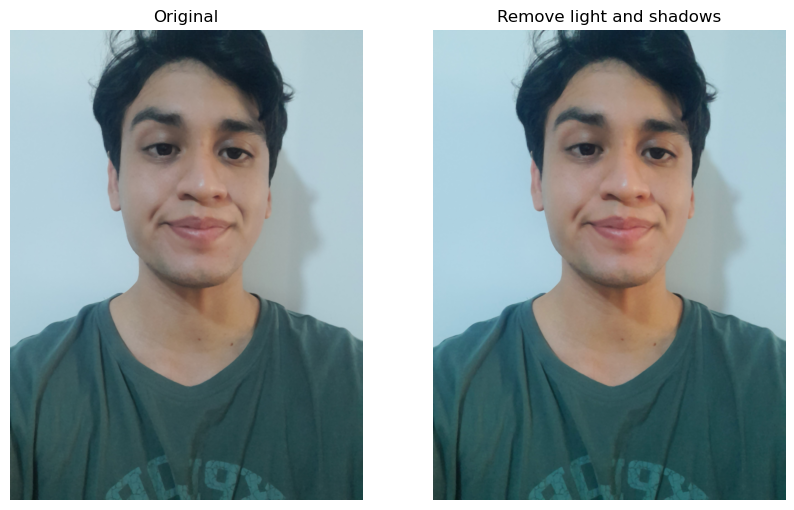

(3408, 2556, 3)


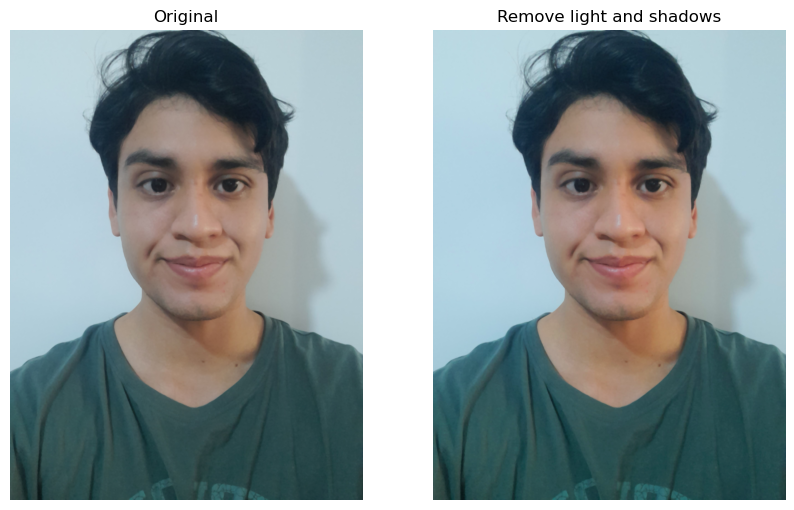

(3408, 2556, 3)


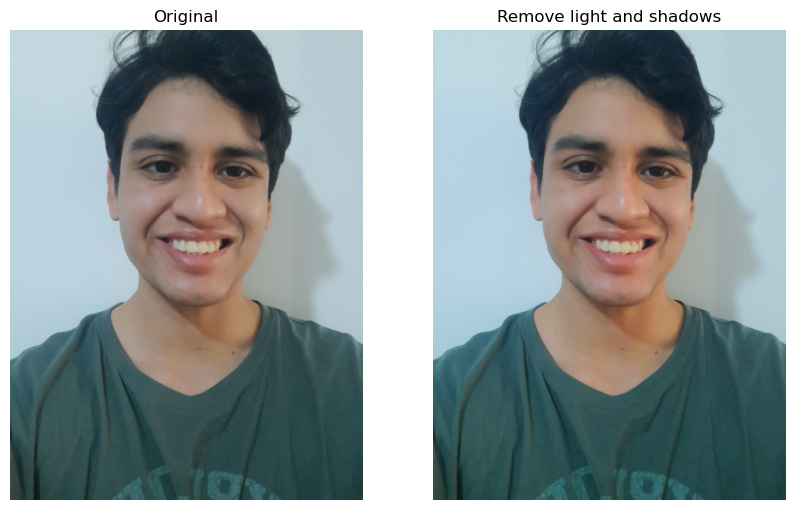

(3408, 2556, 3)


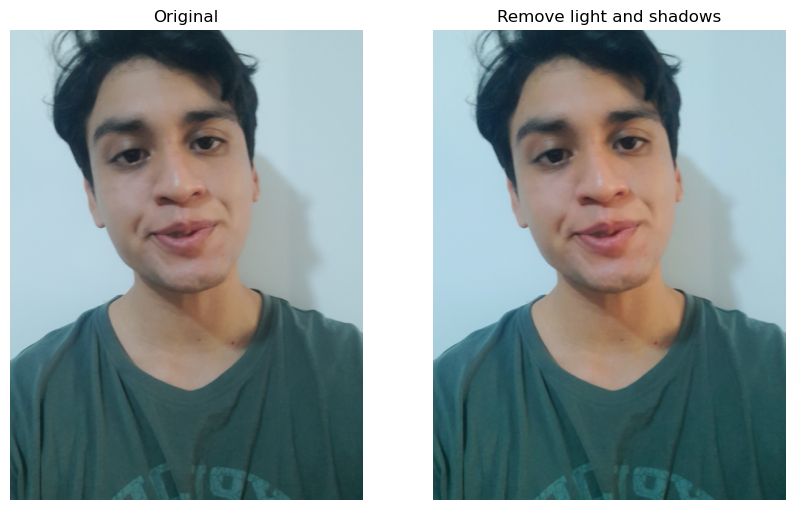

(3408, 2556, 3)


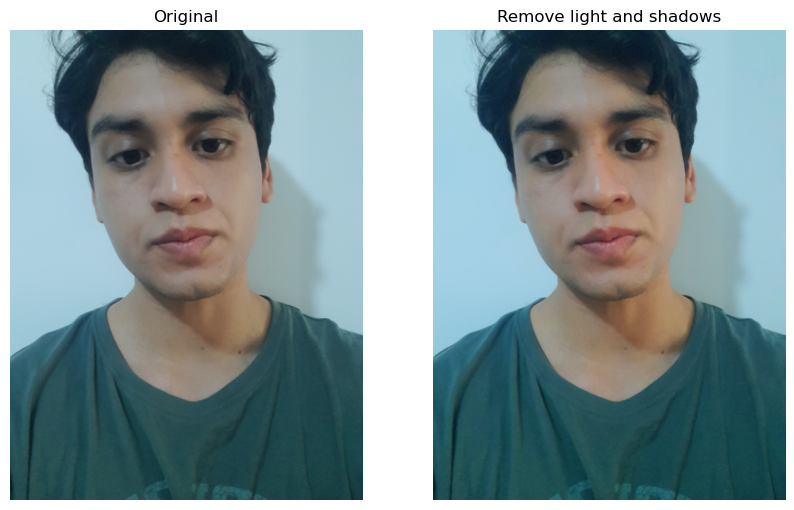

(3408, 2556, 3)


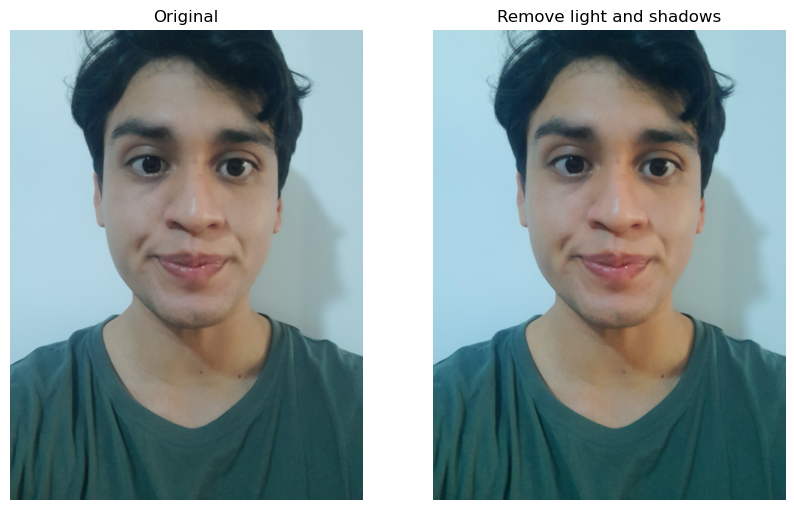

(3408, 2556, 3)


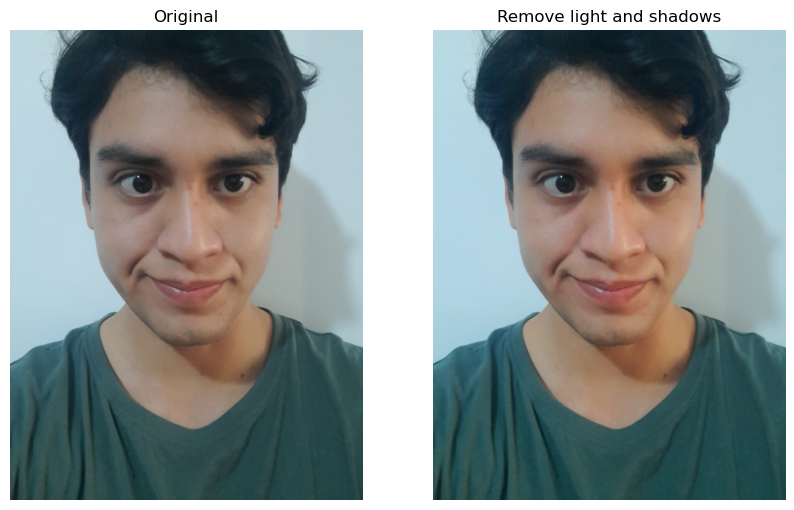

(3408, 2556, 3)


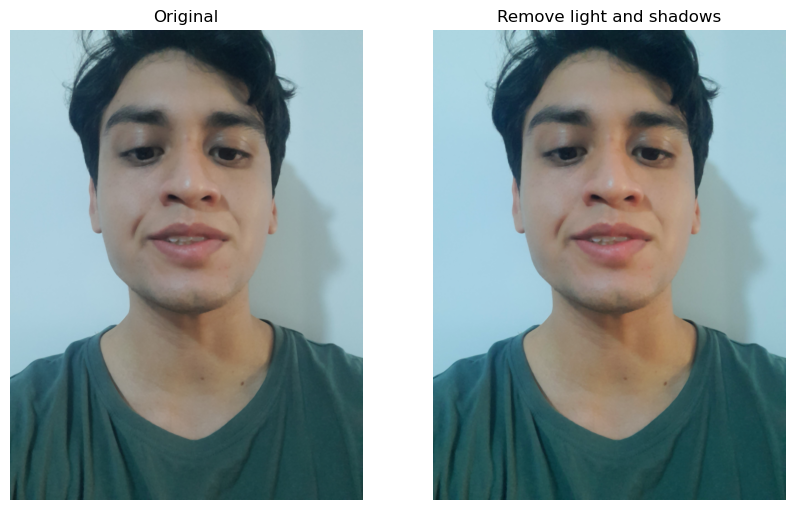

(3408, 2556, 3)


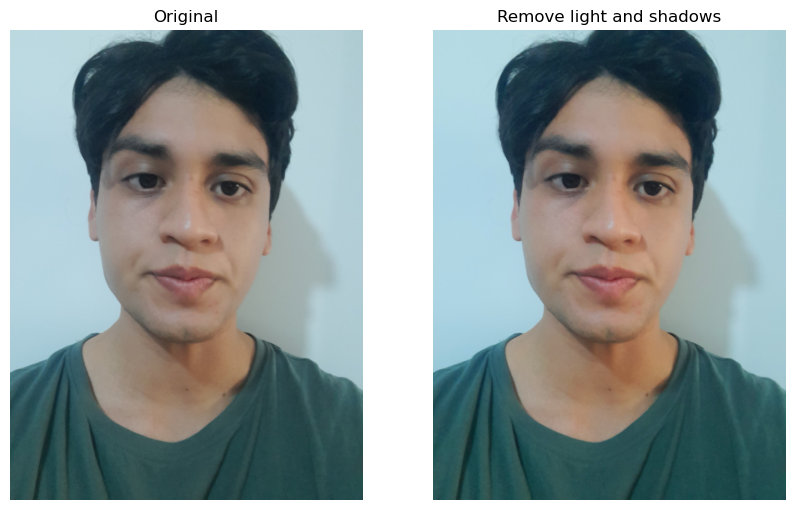

(3408, 2556, 3)


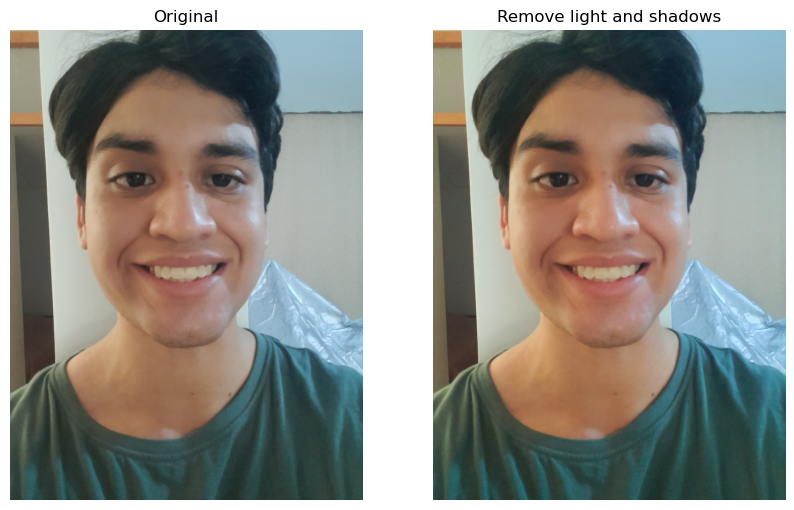

(3408, 2556, 3)


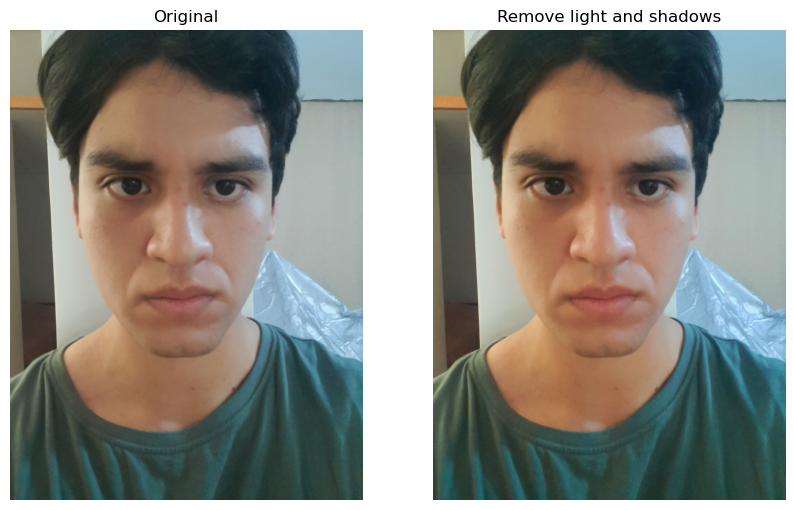

(3408, 2556, 3)


In [300]:
for i in range(0,12):
    remove_sha_lig(image_file=f'./face/jose_luis/{i}.jpg',name='jose_luis',i=i)

## Detección de Rostros

In [22]:
# Function to save the image region of the face
def save_face_region(image_path, face_coordinates,output_directory):
    image = cv2.imread(image_path)
    x, y, width, height = face_coordinates
    face_image = image[y : y+height, x : x+width]
    output_path = os.path.join(output_directory, os.path.basename(image_path))
    cv2.imwrite(output_path, face_image)


In [32]:

import cv2
from mtcnn import MTCNN

# Función de detección de rostro
def face_detection(image_path, output_path):
    # Leer la imagen
    image = cv2.imread(image_path)
    
    # Instanciar el detector MTCNN
    detector = MTCNN()
    
    # Detectar rostros en la imagen
    faces = detector.detect_faces(image)
    
    if len(faces) > 0:
        # Calcular la puntuación de relevancia para cada rostro
        face_scores = [face['box'][2] * face['box'][3] for face in faces]
        
        # Obtener el índice del rostro con la puntuación más alta
        main_face_index = face_scores.index(max(face_scores))
        
        # Obtener las coordenadas del rostro principal
        x, y, width, height = faces[main_face_index]['box']
        
        # Extraer la región del rostro principal
        face_image = image[y:y+height, x:x+width]
        
        # Guardar la imagen del rostro principal
        cv2.imwrite(output_path, face_image)
        
        print("Rostro principal guardado con éxito.")
    else:
        print("No se encontraron rostros en la imagen.")



In [ ]:
for i in range(0,12):
    face_detection(f'./face_sha_lig/aldahir/{i}.jpg', f'./detected/aldahir/{i}.jpg')

In [ ]:
for i in range(0,12):
    face_detection(f'./face_sha_lig/alvaro/{i}.jpg', f'./detected//alvaro/{i}.jpg')

In [ ]:
for i in range(0,12):
    face_detection(f'./face_sha_lig/aracelly/{i}.jpg', f'./detected/aracelly/{i}.jpg')

In [ ]:
for i in range(0,12):
    face_detection(f'./face_sha_lig/brad/{i}.jpg', f'./detected/brad/{i}.jpg')

In [ ]:
for i in range(0,12):
    face_detection(f'./face_sha_lig/carlos/{i}.jpg', f'./detected/carlos/{i}.jpg')

In [ ]:
for i in range(0,12):
    face_detection(f'./face_sha_lig/cesar/{i}.jpg', f'./detected/cesar/{i}.jpg')

In [ ]:
for i in range(0,12):
    face_detection(f'./face_sha_lig/daniela/{i}.jpg', f'./detected/daniela/{i}.jpg')

In [ ]:
for i in range(0,12):
    face_detection(f'./face_sha_lig/fabricio/{i}.jpg', f'./detected/fabricio/{i}.jpg')

In [ ]:
for i in range(0,12):
    face_detection(f'./face_sha_lig/gian/{i}.jpg', f'./detected/gian/{i}.jpg')

In [35]:
for i in range(0,12):
    face_detection(f'./face_sha_lig/johan/{i}.jpg', f'./detected/johan/{i}.jpg')

1/1 [==============================] - 0s 79ms/step
Rostro principal guardado con éxito.
1/1 [==============================] - 0s 82ms/step
Rostro principal guardado con éxito.
1/1 [==============================] - 0s 79ms/step
Rostro principal guardado con éxito.
1/1 [==============================] - 0s 85ms/step
Rostro principal guardado con éxito.
1/1 [==============================] - 0s 79ms/step
Rostro principal guardado con éxito.
1/1 [==============================] - 0s 87ms/step
Rostro principal guardado con éxito.
1/1 [==============================] - 0s 94ms/step
Rostro principal guardado con éxito.
1/1 [==============================] - 0s 80ms/step
Rostro principal guardado con éxito.
1/1 [==============================] - 0s 78ms/step
Rostro principal guardado con éxito.
1/1 [==============================] - 0s 88ms/step
Rostro principal guardado con éxito.
1/1 [==============================] - 0s 85ms/step
Rostro principal guardado con éxito.
1/1 [================

In [ ]:
for i in range(0,12):
    face_detection(f'./face_sha_lig/jorge_vargas/{i}.jpg', f'./detected/jorge_vargas/{i}.jpg')

In [37]:
for i in range(0,12):
    face_detection(f'./face_sha_lig/jose_luis/{i}.jpg', f'./detected/jose_luis/{i}.jpg')

1/1 [==============================] - 0s 83ms/step
Rostro principal guardado con éxito.
1/1 [==============================] - 0s 83ms/step
Rostro principal guardado con éxito.
1/1 [==============================] - 0s 80ms/step
Rostro principal guardado con éxito.
1/1 [==============================] - 0s 80ms/step
Rostro principal guardado con éxito.
1/1 [==============================] - 0s 79ms/step
Rostro principal guardado con éxito.
1/1 [==============================] - 0s 78ms/step
Rostro principal guardado con éxito.
1/1 [==============================] - 0s 80ms/step
Rostro principal guardado con éxito.
1/1 [==============================] - 0s 78ms/step
Rostro principal guardado con éxito.
1/1 [==============================] - 0s 82ms/step
Rostro principal guardado con éxito.
1/1 [==============================] - 0s 78ms/step
Rostro principal guardado con éxito.
1/1 [==============================] - 0s 81ms/step
Rostro principal guardado con éxito.
1/1 [================

In [38]:
for i in range(0,12):
    face_detection(f'./face_sha_lig/joseph/{i}.jpg', f'./detected/joseph/{i}.jpg')

1/1 [==============================] - 0s 82ms/step
Rostro principal guardado con éxito.
1/1 [==============================] - 0s 88ms/step
Rostro principal guardado con éxito.
1/1 [==============================] - 0s 81ms/step
Rostro principal guardado con éxito.
1/1 [==============================] - 0s 88ms/step
Rostro principal guardado con éxito.
1/1 [==============================] - 0s 84ms/step
Rostro principal guardado con éxito.
1/1 [==============================] - 0s 84ms/step
Rostro principal guardado con éxito.
1/1 [==============================] - 0s 85ms/step
Rostro principal guardado con éxito.
1/1 [==============================] - 0s 89ms/step
Rostro principal guardado con éxito.
1/1 [==============================] - 0s 86ms/step
Rostro principal guardado con éxito.
1/1 [==============================] - 0s 86ms/step
Rostro principal guardado con éxito.
1/1 [==============================] - 0s 86ms/step
Rostro principal guardado con éxito.
1/1 [================

In [ ]:
for i in range(0,12):
    face_detection(f'./face_sha_lig/marcos/{i}.jpg', f'./detected/marcos/{i}.jpg')

In [ ]:
for i in range(0,12):
    face_detection(f'./face_sha_lig/mariana/{i}.jpg', f'./detected/mariana/{i}.jpg')

In [41]:
for i in range(0,12):
    face_detection(f'./face_sha_lig/moreno/{i}.jpg', f'./detected/moreno/{i}.jpg')

1/1 [==============================] - 0s 85ms/step
Rostro principal guardado con éxito.
1/1 [==============================] - 0s 83ms/step
Rostro principal guardado con éxito.
1/1 [==============================] - 0s 83ms/step
Rostro principal guardado con éxito.
1/1 [==============================] - 0s 80ms/step
Rostro principal guardado con éxito.
1/1 [==============================] - 0s 79ms/step
Rostro principal guardado con éxito.
1/1 [==============================] - 0s 81ms/step
Rostro principal guardado con éxito.
1/1 [==============================] - 0s 86ms/step
Rostro principal guardado con éxito.
1/1 [==============================] - 0s 81ms/step
Rostro principal guardado con éxito.
1/1 [==============================] - 0s 91ms/step
Rostro principal guardado con éxito.
1/1 [==============================] - 0s 82ms/step
Rostro principal guardado con éxito.
1/1 [==============================] - 0s 80ms/step
Rostro principal guardado con éxito.
1/1 [================

In [42]:
for i in range(0,12):
    face_detection(f'./face_sha_lig/negreros/{i}.jpg', f'./detected/negreros/{i}.jpg')

1/1 [==============================] - 0s 83ms/step
Rostro principal guardado con éxito.
1/1 [==============================] - 0s 86ms/step
Rostro principal guardado con éxito.
1/1 [==============================] - 0s 85ms/step
Rostro principal guardado con éxito.
1/1 [==============================] - 0s 77ms/step
Rostro principal guardado con éxito.
1/1 [==============================] - 0s 78ms/step
Rostro principal guardado con éxito.
1/1 [==============================] - 0s 80ms/step
Rostro principal guardado con éxito.
1/1 [==============================] - 0s 85ms/step
Rostro principal guardado con éxito.
1/1 [==============================] - 0s 81ms/step
Rostro principal guardado con éxito.
1/1 [==============================] - 0s 83ms/step
Rostro principal guardado con éxito.
1/1 [==============================] - 0s 79ms/step
Rostro principal guardado con éxito.
1/1 [==============================] - 0s 79ms/step
Rostro principal guardado con éxito.
1/1 [================

In [43]:
for i in range(0,12):
    face_detection(f'./face_sha_lig/oscar/{i}.jpg', f'./detected/oscar/{i}.jpg')

1/1 [==============================] - 0s 79ms/step
Rostro principal guardado con éxito.
1/1 [==============================] - 0s 83ms/step
Rostro principal guardado con éxito.
1/1 [==============================] - 0s 88ms/step
Rostro principal guardado con éxito.
1/1 [==============================] - 0s 79ms/step
Rostro principal guardado con éxito.
1/1 [==============================] - 0s 78ms/step
Rostro principal guardado con éxito.
1/1 [==============================] - 0s 82ms/step
Rostro principal guardado con éxito.
1/1 [==============================] - 0s 87ms/step
Rostro principal guardado con éxito.
1/1 [==============================] - 0s 83ms/step
Rostro principal guardado con éxito.
1/1 [==============================] - 0s 79ms/step
Rostro principal guardado con éxito.
1/1 [==============================] - 0s 82ms/step
Rostro principal guardado con éxito.
1/1 [==============================] - 0s 80ms/step
Rostro principal guardado con éxito.
1/1 [================

In [44]:
for i in range(0,12):
    face_detection(f'./face_sha_lig/paulo/{i}.jpg', f'./detected/paulo/{i}.jpg')

1/1 [==============================] - 0s 84ms/step
Rostro principal guardado con éxito.
1/1 [==============================] - 0s 87ms/step
Rostro principal guardado con éxito.
1/1 [==============================] - 0s 86ms/step
Rostro principal guardado con éxito.
1/1 [==============================] - 0s 83ms/step
Rostro principal guardado con éxito.
1/1 [==============================] - 0s 89ms/step
Rostro principal guardado con éxito.
1/1 [==============================] - 0s 82ms/step
Rostro principal guardado con éxito.
1/1 [==============================] - 0s 86ms/step
Rostro principal guardado con éxito.
1/1 [==============================] - 0s 86ms/step
Rostro principal guardado con éxito.
1/1 [==============================] - 0s 81ms/step
Rostro principal guardado con éxito.
1/1 [==============================] - 0s 81ms/step
Rostro principal guardado con éxito.
1/1 [==============================] - 0s 85ms/step
Rostro principal guardado con éxito.
1/1 [================

In [ ]:
for i in range(0,12):
    face_detection(f'./face_sha_lig/rolando/{i}.jpg', f'./detected/rolando/{i}.jpg')

In [46]:
for i in range(0,12):
    face_detection(f'./face_sha_lig/samadhi/{i}.jpg', f'./detected/samadhi/{i}.jpg')

1/1 [==============================] - 0s 82ms/step
Rostro principal guardado con éxito.
1/1 [==============================] - 0s 87ms/step
Rostro principal guardado con éxito.
1/1 [==============================] - 0s 96ms/step
Rostro principal guardado con éxito.
1/1 [==============================] - 0s 84ms/step
Rostro principal guardado con éxito.
1/1 [==============================] - 0s 84ms/step
Rostro principal guardado con éxito.
1/1 [==============================] - 0s 89ms/step
Rostro principal guardado con éxito.
1/1 [==============================] - 0s 91ms/step
Rostro principal guardado con éxito.
1/1 [==============================] - 0s 82ms/step
Rostro principal guardado con éxito.
1/1 [==============================] - 0s 81ms/step
Rostro principal guardado con éxito.
1/1 [==============================] - 0s 83ms/step
Rostro principal guardado con éxito.
1/1 [==============================] - 0s 82ms/step
Rostro principal guardado con éxito.
1/1 [================

In [ ]:
for i in range(0,12):
    face_detection(f'./face_sha_lig/walter/{i}.jpg', f'./detected/walter/{i}.jpg')

## Dataset Flatten

In [ ]:

# directorio de las imágenes detectadas
detected_dir = './detected'

dataset_dir = './dataset'

if not os.path.exists(dataset_dir):
    os.makedirs(dataset_dir)
    
subfolders = [f.path for f in os.scandir(detected_dir) if f.is_dir()]

image_count = 0
for subfolder in subfolders:
    image_files = [f.path for f in os.scandir(subfolder) if f.is_file() and f.name.endswith(('.jpg', '.jpeg', '.png'))]
    
    for image_file in image_files:
        dataset_filename = str(image_count) + os.path.splitext(image_file)[1]
        destination = os.path.join(dataset_dir, dataset_filename)
        shutil.copy(image_file, destination)
        
        image_count += 1

print("Se han juntado y enumerado", image_count, "imágenes en el dataset.")

## Resize

In [ ]:
def resize_images(input_dir, output_dir, width, height):

    if not os.path.exists(output_dir):
        os.makedirs(output_dir)

    files = os.listdir(input_dir)

    for filename in files:
        input_path = os.path.join(input_dir, filename)
        image = cv2.imread(input_path)

        if image is not None:
            resized_image = cv2.resize(image, (width, height))

            output_path = os.path.join(output_dir, filename)

            cv2.imwrite(output_path, resized_image)

            print(f"Imagen redimensionada: {filename}")
        else:
            print(f"Error al leer la imagen: {filename}")

input_directory = './dataset'  
output_directory = './data'  
target_width = 300 
target_height = 400  

resize_images(input_directory, output_directory, target_width, target_height)

In [ ]:
import matplotlib.pyplot as plt
import cv2

def show_image(image_path):
    
    image = cv2.imread(image_path)

    if image is not None:
        image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        print(image_rgb.shape)
        plt.imshow(image_rgb)
        plt.axis('off') 
        plt.show()
    else:
        print("No se pudo leer la imagen.")

# Ejemplo de uso
image_path = './data/226.jpg' 
show_image(image_path)


(400, 300, 3)


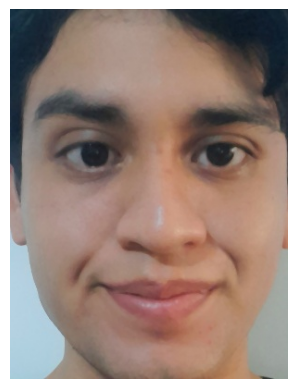

In [73]:
image_path = './data/148.jpg'
show_image(image_path)

## Data Labeling

In [63]:
labels = pd.read_excel('./datalabels.xlsx') 

In [64]:
labels.head(-1)

,name,code
0,Aldahir Gutierrez Pretell,0
1,Aldahir Gutierrez Pretell,0
2,Aldahir Gutierrez Pretell,0
3,Aldahir Gutierrez Pretell,0
4,Aldahir Gutierrez Pretell,0
...,...,...
258,Alvarado Cabanillas Walter,21
259,Alvarado Cabanillas Walter,21
260,Alvarado Cabanillas Walter,21
261,Alvarado Cabanillas Walter,21


In [65]:
# Definir las clases
num_classes = 22

# Convertir las etiquetas a formato one-hot
y = to_categorical(labels['code'], num_classes)

In [66]:
y

array([[1., 0., 0., ..., 0., 0., 0.],
       [1., 0., 0., ..., 0., 0., 0.],
       [1., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 1.],
       [0., 0., 0., ..., 0., 0., 1.],
       [0., 0., 0., ..., 0., 0., 1.]], dtype=float32)

In [67]:
y.shape

(264, 22)

## Data Input

In [68]:
data_dir = './data'

# get names of directory images
image_files = [f for f in os.listdir(data_dir) if os.path.isfile(os.path.join(data_dir, f))]

# sorted name in numeric
image_files = sorted(image_files, key=lambda x: int(x.split('.')[0]))

# read images and store in numpy array
X = []
for file in image_files:
    image_path = os.path.join(data_dir, file)
    image = Image.open(image_path)
    image = image.convert("RGB")  
    image = np.array(image)  
    X.append(image)

X = np.array(X)

In [69]:
print(X.shape)

(264, 400, 300, 3)


## Resnet Architecture

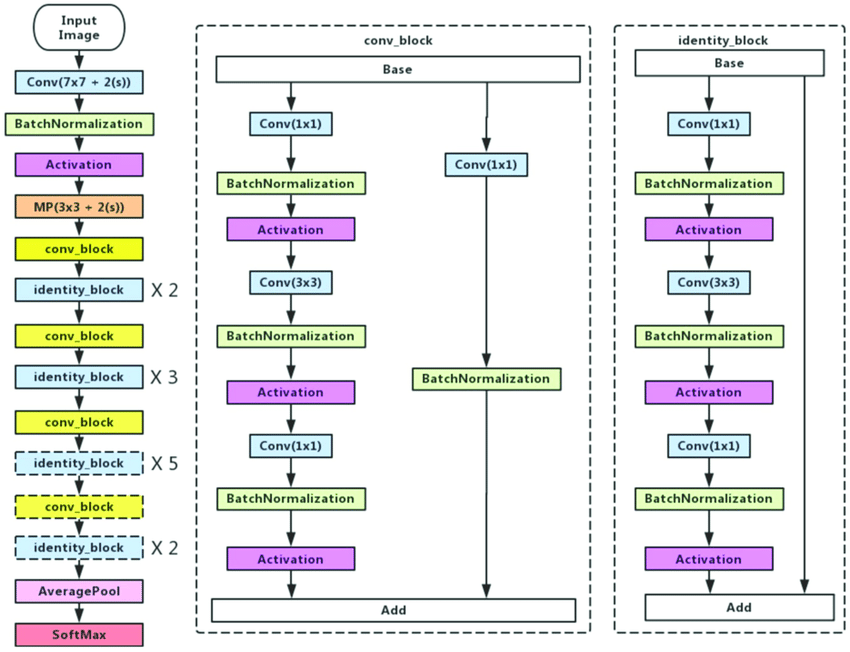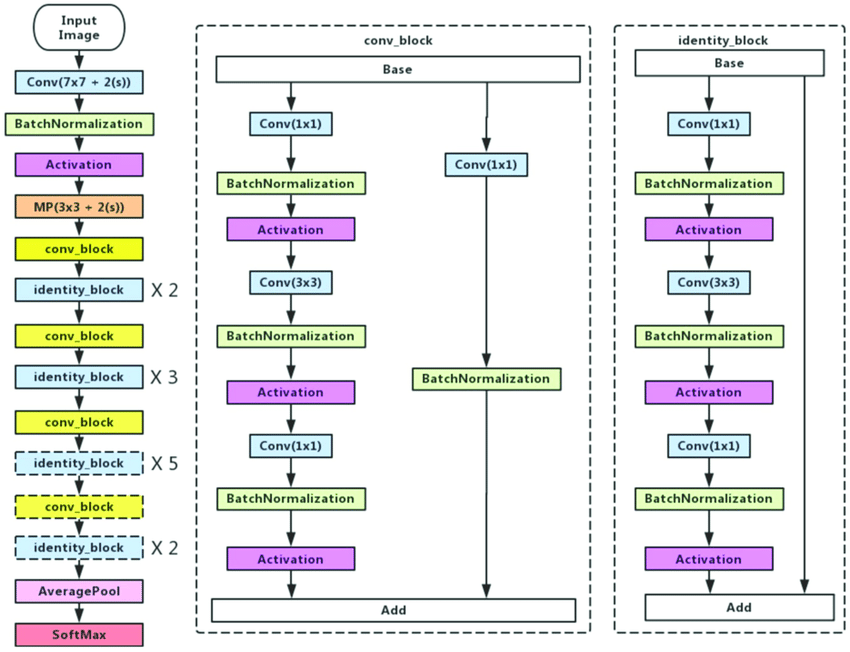

## Model

In [70]:
seed = 1601

In [71]:
import numpy as np
from sklearn.model_selection import train_test_split
from tensorflow.keras.applications import InceptionResNetV2
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# split data in train and test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=seed, shuffle=True)

# dimensions of each face
input_shape = (400, 300, 3)

# Normalizar los datos de entrada
X_train = X_train / 255.0
X_test = X_test / 255.0

# data augmentation
datagen = ImageDataGenerator(
    rotation_range=10,
    width_shift_range=0.1,
    height_shift_range=0.1,
    horizontal_flip=True
)
datagen.fit(X_train)

# load the pretrained InceptionResNetV2 model without including the final layer
base_model = InceptionResNetV2(include_top=False, weights='imagenet', input_shape=input_shape)

# freeze all layers of the base model
for layer in base_model.layers:
    layer.trainable = False

# applying the base model and additional layers
model = Sequential()
model.add(base_model)
model.add(Flatten())
model.add(Dense(22, activation='softmax'))

## Architecture Summary

In [72]:
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 inception_resnet_v2 (Functi  (None, 11, 8, 1536)      54336736  
 onal)                                                           
                                                                 
 flatten_1 (Flatten)         (None, 135168)            0         
                                                                 
 dense_1 (Dense)             (None, 22)                2973718   
                                                                 
Total params: 57,310,454
Trainable params: 2,973,718
Non-trainable params: 54,336,736
_________________________________________________________________


In [73]:
np.random.seed(seed)  
tf.random.set_seed(seed)
random.seed(seed)

In [74]:
checkpoint = ModelCheckpoint('mejor_modelo.h5', monitor='val_accuracy', save_best_only=True, mode='max', verbose=1)

In [75]:
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

In [77]:
history = model.fit(datagen.flow(X_train, y_train, batch_size=32),
                    steps_per_epoch=len(X_train) // 32,
                    epochs=21,
                    validation_data=(X_test, y_test),
                     callbacks=[checkpoint]
                   )

Epoch 1/21
6/6 [==============================] - ETA: 0s - loss: 0.0687 - accuracy: 0.9888
Epoch 1: val_accuracy did not improve from 0.96226
6/6 [==============================] - 24s 4s/step - loss: 0.0687 - accuracy: 0.9888 - val_loss: 1.3472 - val_accuracy: 0.9434
Epoch 2/21
6/6 [==============================] - ETA: 0s - loss: 0.2357 - accuracy: 0.9665
Epoch 2: val_accuracy did not improve from 0.96226
6/6 [==============================] - 23s 4s/step - loss: 0.2357 - accuracy: 0.9665 - val_loss: 1.3458 - val_accuracy: 0.9434
Epoch 3/21
6/6 [==============================] - ETA: 0s - loss: 0.4702 - accuracy: 0.9665
Epoch 3: val_accuracy did not improve from 0.96226
6/6 [==============================] - 23s 4s/step - loss: 0.4702 - accuracy: 0.9665 - val_loss: 1.2306 - val_accuracy: 0.9245
Epoch 4/21
6/6 [==============================] - ETA: 0s - loss: 0.4691 - accuracy: 0.9609
Epoch 4: val_accuracy improved from 0.96226 to 0.98113, saving model to mejor_modelo.h5
6/6 [=====

In [78]:
modelo_archivo = './mejor_modelo.h5'
model2 = load_model(modelo_archivo)


In [79]:
test_loss, test_accuracy = model2.evaluate(X_test, y_test)
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)

2/2 [==============================] - 7s 2s/step - loss: 1.2187 - accuracy: 0.9811
Test Loss: 1.2187280654907227
Test Accuracy: 0.9811320900917053


In [46]:
model.save('modelo_ResNetV2.h5')

In [49]:
#load model
modelo_archivo = './modelo_ResNetV2.h5'
model = load_model(modelo_archivo)

In [136]:
index = 7

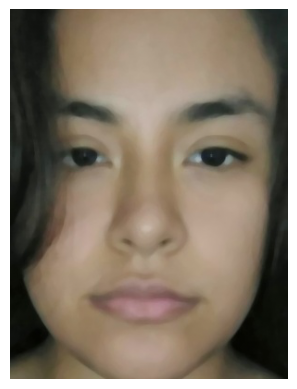

In [137]:
plt.imshow(X_test[index])
plt.axis('off') 
plt.show()

In [138]:
x_input = X_test[index].copy()

In [139]:
imagen_batch = np.expand_dims(x_input, axis=0)

In [140]:
imagen_batch.shape

(1, 400, 300, 3)

In [141]:
recognized_person = model.predict(imagen_batch)

1/1 [==============================] - 0s 184ms/step


In [142]:

code = np.argmax(recognized_person)
result = labels.loc[labels['code'] == code, 'name']
if len(result) > 0:
    print(f"El nombre de la persona con código {code} es:", result.iloc[0])
else:
    print(f"No se encontró ninguna persona con {code} 12.")

El nombre de la persona con código 6 es: Daniela Avalos Moreno
